In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/README.dataset.txt
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/README.roboflow.txt
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/data.yaml
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/split.py
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/labels/img_1394_jpg.rf.7b97ce09eb15862943c90a0a22c56b52.txt
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/labels/img_38120_jpg.rf.b8d4831d16a6efedfb3f60d010694a01.txt
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/labels/img_11414_jpg.rf.80c0f550ca9ba4ebb29efc6ee40abb7f.txt
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/labels/img_21680_jpg.rf.4cc292033b9c17dae61cdf83c4c8a652.txt
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/labels/img_17995_jpg.rf.d7f4f79f30ab2aa6f35a8da79df65dc9.txt
/kaggle/input/distracted-driving/Distracte

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.7/914.7 kB 21.3 MB/s eta 0:00:0000:01


In [ ]:
# Importing the required libraries
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns
import torch

sns.set_style('darkgrid')

%matplotlib inline

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


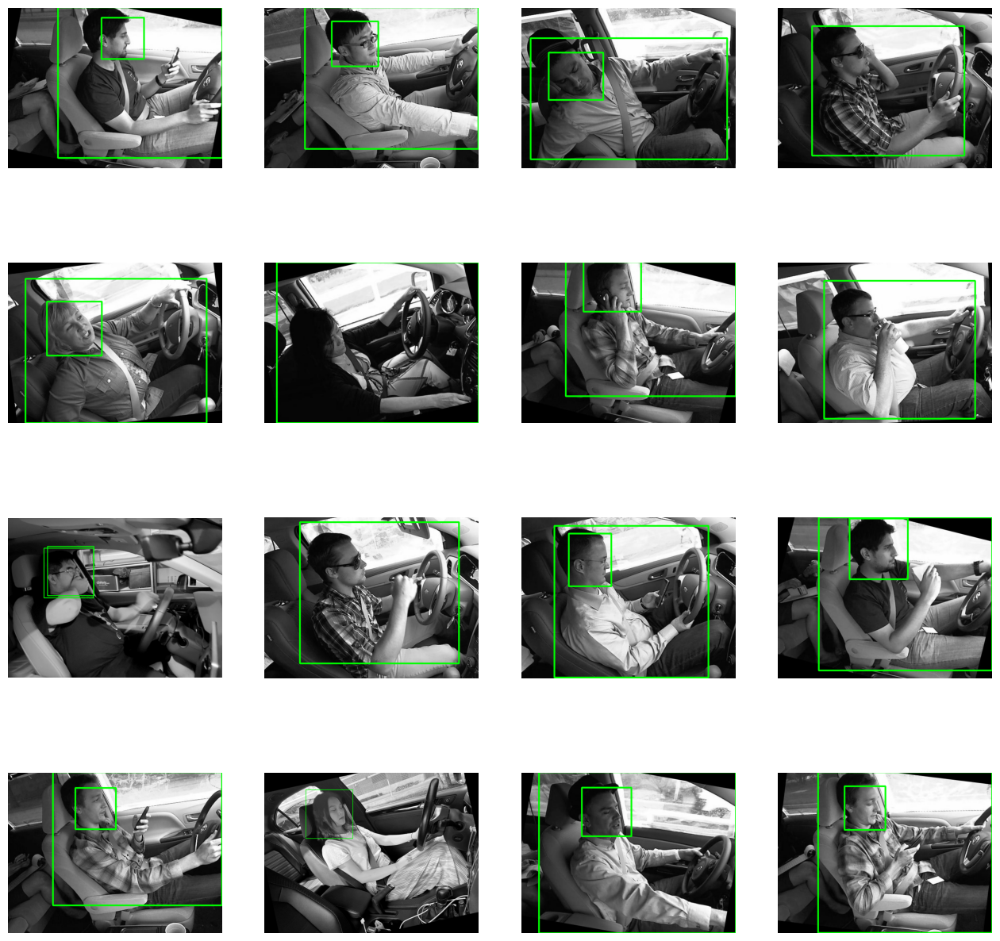

In [4]:
# Define the paths to the images and labels directories
train_images = "/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/train/images"
train_labels = "/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/train/labels"

test_images = "/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/test/images"
test_labels = "/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/test/labels"

val_images = "/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/images"
val_labels = "/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the object detections
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4
    
    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)


    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

In [5]:
# Load an image using OpenCV
image = cv2.imread("/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/train/images/00992906-254F-4182-97B7-C9FF20CF69FE_jpeg.rf.221cb40b49fd2bf5c08adb9ee124415c.jpg")

# Get the size of the image
height, width, channels = image.shape
print(f"The image has dimensions {width}x{height} and {channels} channels.")

The image has dimensions 1280x958 and 3 channels.


In [6]:
from ultralytics import YOLO

# Load a COCO-pretrained YOLO11n model
model = YOLO("yolov10s.pt")

100%|██████████| 15.9M/15.9M [00:00<00:00, 218MB/s]


In [7]:
# Define the path where you want to save the data.yaml file
yaml_file_path = '/kaggle/working/data.yaml'

# Write the content to the YAML file
with open(yaml_file_path, 'w') as f:
    f.write("""# Dataset Configuration
Path: /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11
train: /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/train/images
val: /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/images
test: /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/test/images
nc: 12
names: ['c0 - Safe Driving', 'c1 - Texting', 'c2 - Talking on the phone', 'c3 - Operating the Radio', 
        'c4 - Drinking', 'c5 - Reaching Behind', 'c6 - Hair and Makeup', 'c7 - Talking to Passenger', 
        'd0 - Eyes Closed', 'd1 - Yawning', 'd2 - Nodding Off', 'd3 - Eyes Open']

roboflow:
  workspace: flytech
  project: distracted-driving-v2wk5-f5vtj
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/flytech/distracted-driving-v2wk5-f5vtj/dataset/1
""")


In [8]:
import torch

# Free up GPU memory
torch.cuda.empty_cache()

# Train the model with specified optimizer and learning rate
model.train(
    data='/kaggle/working/data.yaml',  
    epochs=25,
    imgsz=640,                                  
    device='0',                       
    optimizer='SGD',  # Choose an optimizer (e.g., SGD or Adam)
    lr0=0.01,       # Set initial learning rate
)

Ultralytics 8.3.74 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov10s.pt, data=/kaggle/working/data.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=Tru

100%|██████████| 755k/755k [00:00<00:00, 24.0MB/s]


Overriding model.yaml nc=80 with nc=12

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1     36096  ultralytics.nn.modules.block.SCDown          [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1    137728  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 99.4MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/train/labels... 17909 images, 0 backgrounds, 0 corrupt: 100%|██████████| 17909/17909 [00:52<00:00, 342.51it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.4 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/labels... 2238 images, 1 backgrounds, 0 corrupt: 100%|██████████| 2238/2238 [00:06<00:00, 363.95it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 99 weight(decay=0.0), 112 weight(decay=0.0005), 111 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      5.26G      2.172      3.828      3.004         22        640: 100%|██████████| 1120/1120 [06:46<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:19<00:00,  3.62it/s]

                   all       2238       3813      0.768      0.822      0.856      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      5.22G      1.977      1.967      2.743         18        640: 100%|██████████| 1120/1120 [06:42<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:18<00:00,  3.89it/s]

                   all       2238       3813      0.852      0.849      0.923      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      5.19G      2.046      2.027      2.783         26        640: 100%|██████████| 1120/1120 [06:38<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.92it/s]

                   all       2238       3813      0.749      0.759      0.847      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      5.21G      2.035      2.004       2.77         24        640: 100%|██████████| 1120/1120 [06:36<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.99it/s]

                   all       2238       3813      0.839      0.852      0.919      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      5.21G       1.94      1.808      2.693         17        640: 100%|██████████| 1120/1120 [06:37<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.97it/s]

                   all       2238       3813      0.832      0.883      0.936      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25       5.2G      1.869      1.676      2.643         17        640: 100%|██████████| 1120/1120 [06:36<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.97it/s]

                   all       2238       3813        0.9      0.915      0.954      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25       5.2G      1.826      1.594      2.608         26        640: 100%|██████████| 1120/1120 [06:36<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.90it/s]

                   all       2238       3813      0.887      0.914      0.963       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25       5.2G      1.781      1.508       2.57         24        640: 100%|██████████| 1120/1120 [06:36<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.91it/s]

                   all       2238       3813       0.91      0.924      0.959      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      5.21G      1.746      1.458      2.547         22        640: 100%|██████████| 1120/1120 [06:36<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.99it/s]

                   all       2238       3813      0.893      0.931      0.959      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25       5.2G      1.716       1.39      2.528         21        640: 100%|██████████| 1120/1120 [06:36<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  4.00it/s]

                   all       2238       3813      0.919      0.934       0.97      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      5.22G      1.694      1.353       2.51         22        640: 100%|██████████| 1120/1120 [06:36<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.98it/s]

                   all       2238       3813      0.917      0.929      0.972      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25       5.2G      1.658      1.308      2.487         24        640: 100%|██████████| 1120/1120 [06:36<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.97it/s]

                   all       2238       3813      0.942      0.945      0.973      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25       5.2G      1.644      1.297      2.487         27        640: 100%|██████████| 1120/1120 [06:37<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.95it/s]

                   all       2238       3813      0.944      0.964      0.979      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25       5.2G      1.618      1.243      2.464         15        640: 100%|██████████| 1120/1120 [06:36<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.98it/s]

                   all       2238       3813      0.931      0.956      0.977      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      5.21G      1.602      1.214      2.451         20        640: 100%|██████████| 1120/1120 [06:36<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.97it/s]

                   all       2238       3813      0.934      0.952      0.976      0.809


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      5.18G      1.589     0.7397      2.659          9        640: 100%|██████████| 1120/1120 [06:31<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  4.00it/s]

                   all       2238       3813      0.935      0.959       0.97      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      5.18G      1.571     0.7106      2.649          9        640: 100%|██████████| 1120/1120 [06:30<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.95it/s]

                   all       2238       3813      0.941      0.959      0.968      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      5.18G      1.549     0.6896      2.627          9        640: 100%|██████████| 1120/1120 [06:30<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.97it/s]

                   all       2238       3813      0.928      0.972      0.975      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25      5.18G      1.525     0.6646      2.599          9        640: 100%|██████████| 1120/1120 [06:30<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.94it/s]

                   all       2238       3813      0.951      0.967       0.98      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      5.18G      1.506     0.6389      2.578          9        640: 100%|██████████| 1120/1120 [06:31<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.93it/s]

                   all       2238       3813      0.941      0.974      0.977      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      5.18G       1.48     0.6229      2.554          8        640: 100%|██████████| 1120/1120 [06:31<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.96it/s]

                   all       2238       3813      0.962      0.971      0.982      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      5.18G      1.457     0.5976      2.536         10        640: 100%|██████████| 1120/1120 [06:31<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.97it/s]

                   all       2238       3813      0.945      0.982      0.975      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      5.18G       1.43     0.5773      2.512         10        640: 100%|██████████| 1120/1120 [06:31<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.98it/s]

                   all       2238       3813      0.954      0.977      0.983      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      5.18G       1.41     0.5649      2.496          9        640: 100%|██████████| 1120/1120 [06:31<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  4.01it/s]

                   all       2238       3813      0.966       0.97      0.983      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      5.18G      1.387     0.5466      2.476          8        640: 100%|██████████| 1120/1120 [06:31<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:17<00:00,  3.96it/s]

                   all       2238       3813      0.962      0.972      0.983      0.844



25 epochs completed in 2.885 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 16.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 16.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.74 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10s summary (fused): 293 layers, 8,044,248 parameters, 0 gradients, 24.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:18<00:00,  3.88it/s]


                   all       2238       3813      0.963      0.972      0.983      0.844
     c0 - Safe Driving        240        240       0.96      0.983      0.989       0.89
          c1 - Texting        268        268      0.988      0.996      0.995      0.922
c2 - Talking on the phone        291        291      0.991      0.997      0.995      0.846
c3 - Operating the Radio        245        245      0.979      0.996      0.986      0.953
         c4 - Drinking        269        269      0.985      0.999      0.995       0.91
  c5 - Reaching Behind        260        260      0.996          1      0.995      0.919
  c6 - Hair and Makeup        297        297      0.975      0.997      0.995      0.915
c7 - Talking to Passenger        208        208      0.916      0.949      0.984      0.923
      d0 - Eyes Closed        378        379      0.906      0.862      0.937      0.599
          d1 - Yawning         80         80      0.951      0.964       0.96      0.713
      d2 - No

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 4.5ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7eddea6cbc70>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,  

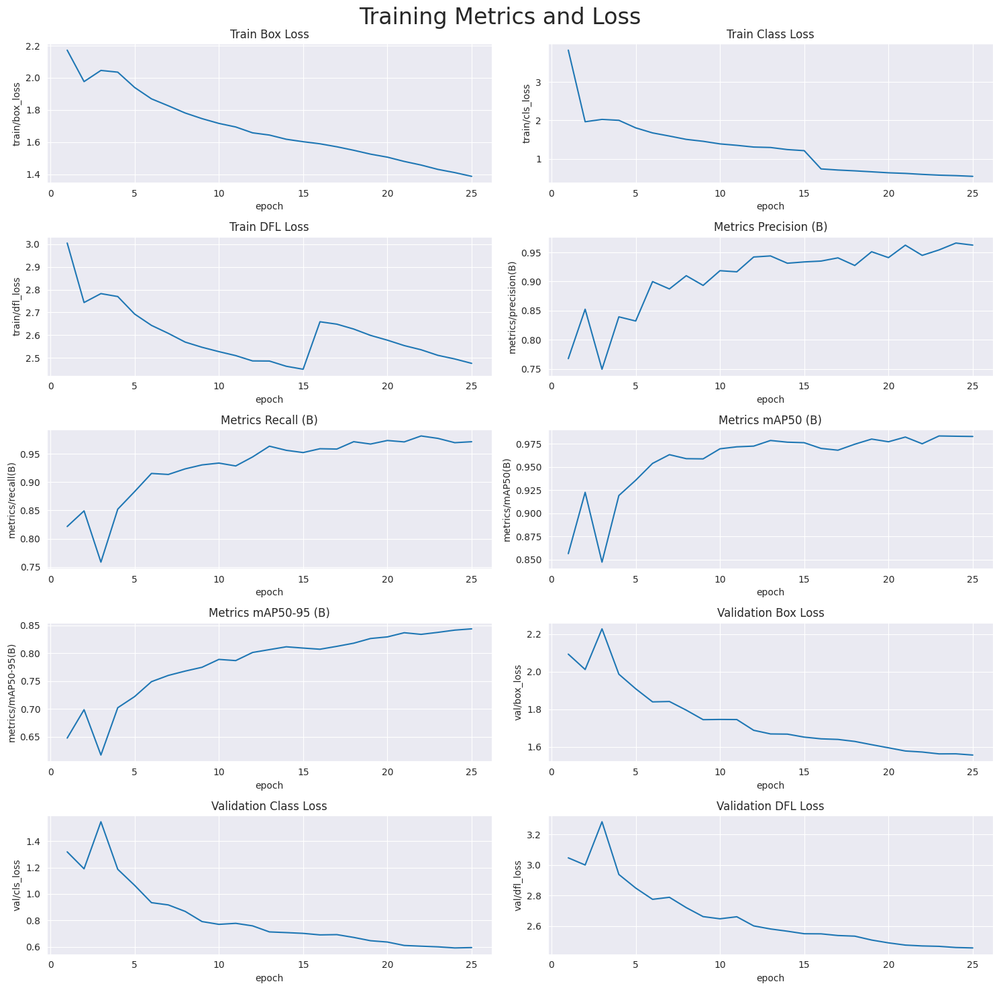

In [9]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [10]:
%matplotlib inline
# Loading the best performing model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Evaluating the model on the test dataset
metrics = model.val(conf = 0.25, split = 'test')

Ultralytics 8.3.74 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10s summary (fused): 293 layers, 8,044,248 parameters, 0 gradients, 24.5 GFLOPs


val: Scanning /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/test/labels... 2240 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2240/2240 [00:14<00:00, 158.41it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/test is not writeable, cache not saved.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 140/140 [00:26<00:00,  5.30it/s]


                   all       2240       3792      0.959      0.977      0.981      0.856
     c0 - Safe Driving        233        233      0.936          1       0.98      0.899
          c1 - Texting        257        257      0.992      0.996      0.995      0.932
c2 - Talking on the phone        275        275      0.985      0.993      0.995      0.857
c3 - Operating the Radio        262        262      0.981          1      0.995      0.956
         c4 - Drinking        290        290      0.994          1      0.995      0.921
  c5 - Reaching Behind        288        288      0.983          1      0.994      0.935
  c6 - Hair and Makeup        276        276      0.986      0.993      0.995      0.923
c7 - Talking to Passenger        202        202      0.896       0.97      0.979      0.928
      d0 - Eyes Closed        363        363      0.879      0.842      0.897      0.628
          d1 - Yawning         74         74          1      0.991      0.995      0.739
      d2 - No

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 8.5ms inference, 0.0ms loss, 0.1ms postprocess per image
Results saved to runs/detect/val


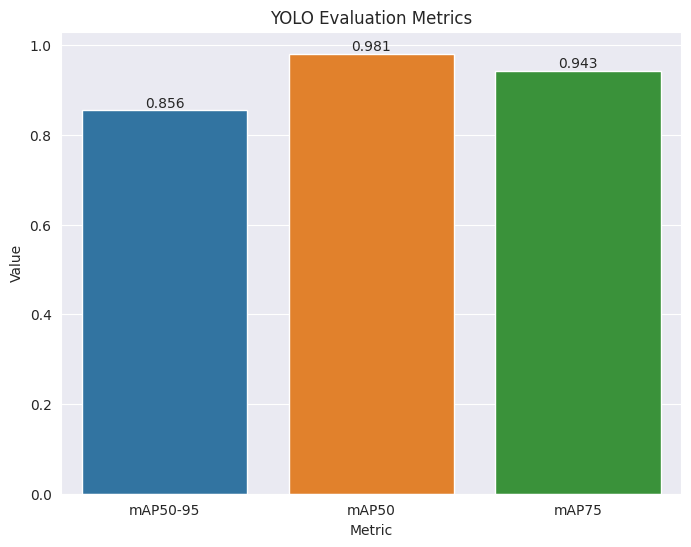

In [11]:
%matplotlib inline
# Create the barplot
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])

# Set the title and axis labels
ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

# Set the figure size
fig = plt.gcf()
fig.set_size_inches(8, 6)

# Add the values on top of the bars
for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')
    
# Show the plot
plt.show()

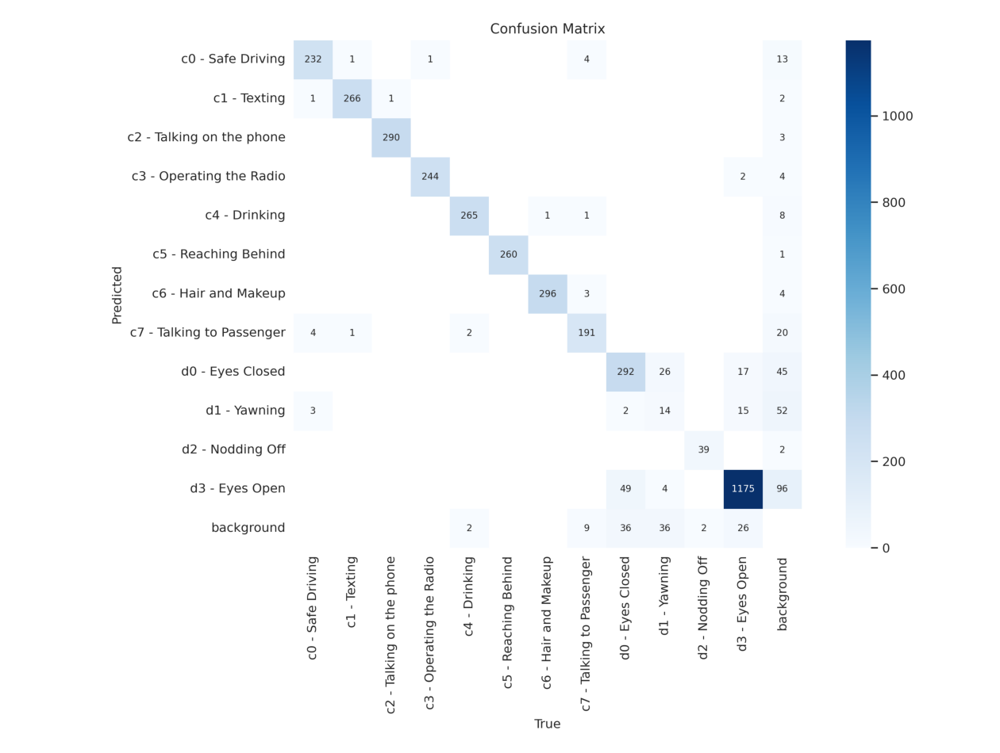

In [12]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/confusion_matrix.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

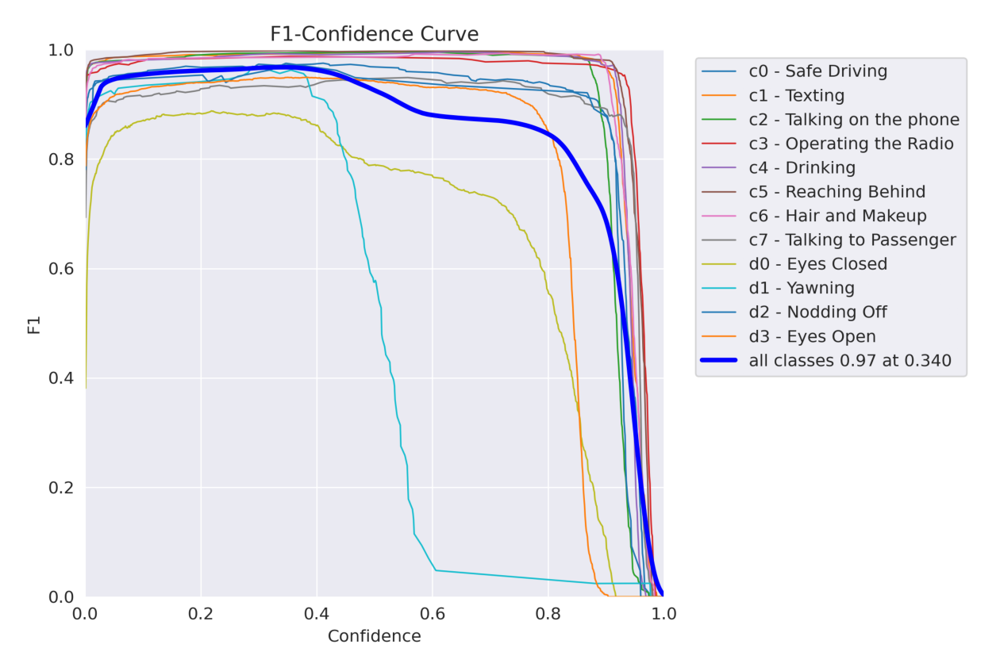

In [13]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/F1_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

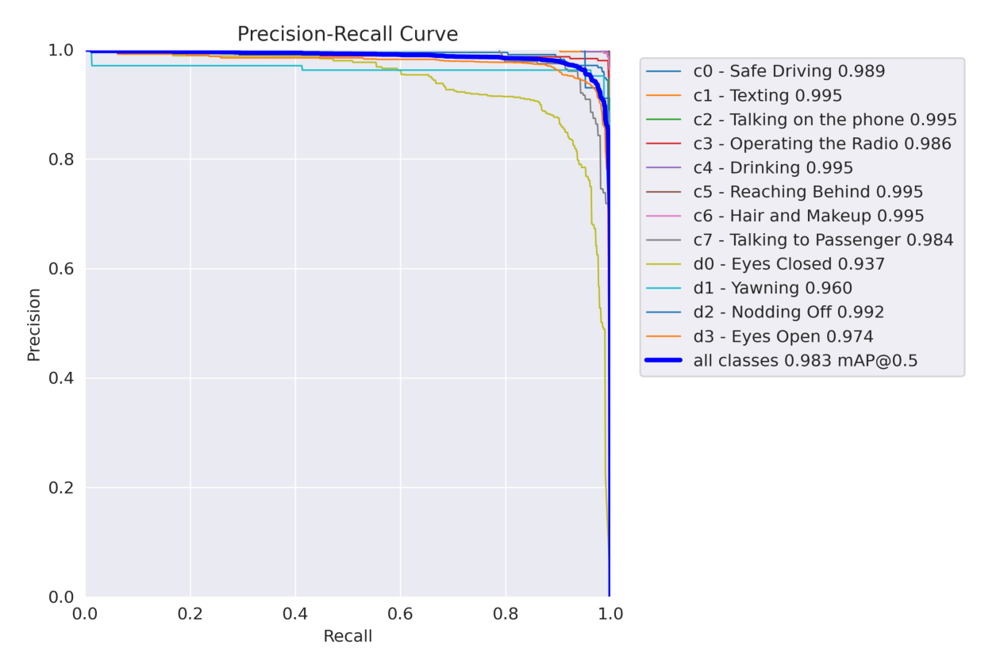

In [14]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/PR_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

In [15]:
# Function to perform ship detections
def ship_detect(img_path):
    
    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()
    
    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
    
    return detect_img


0: 480x640 1 c1 - Texting, 1 d3 - Eyes Open, 45.2ms
Speed: 1.5ms preprocess, 45.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 14.0ms
Speed: 2.1ms preprocess, 14.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 c0 - Safe Driving, 14.0ms
Speed: 1.2ms preprocess, 14.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 c5 - Reaching Behind, 14.0ms
Speed: 1.4ms preprocess, 14.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 d0 - Eyes Closed, 1 d2 - Nodding Off, 14.0ms
Speed: 1.9ms preprocess, 14.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 c7 - Talking to Passenger, 1 d3 - Eyes Open, 14.0ms
Speed: 1.5ms preprocess, 14.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 d0 - Eyes Closed, 1 d2 - Nodding Off, 13.4ms
Speed: 2.2ms preprocess, 13.4ms inference, 0.5ms postprocess p

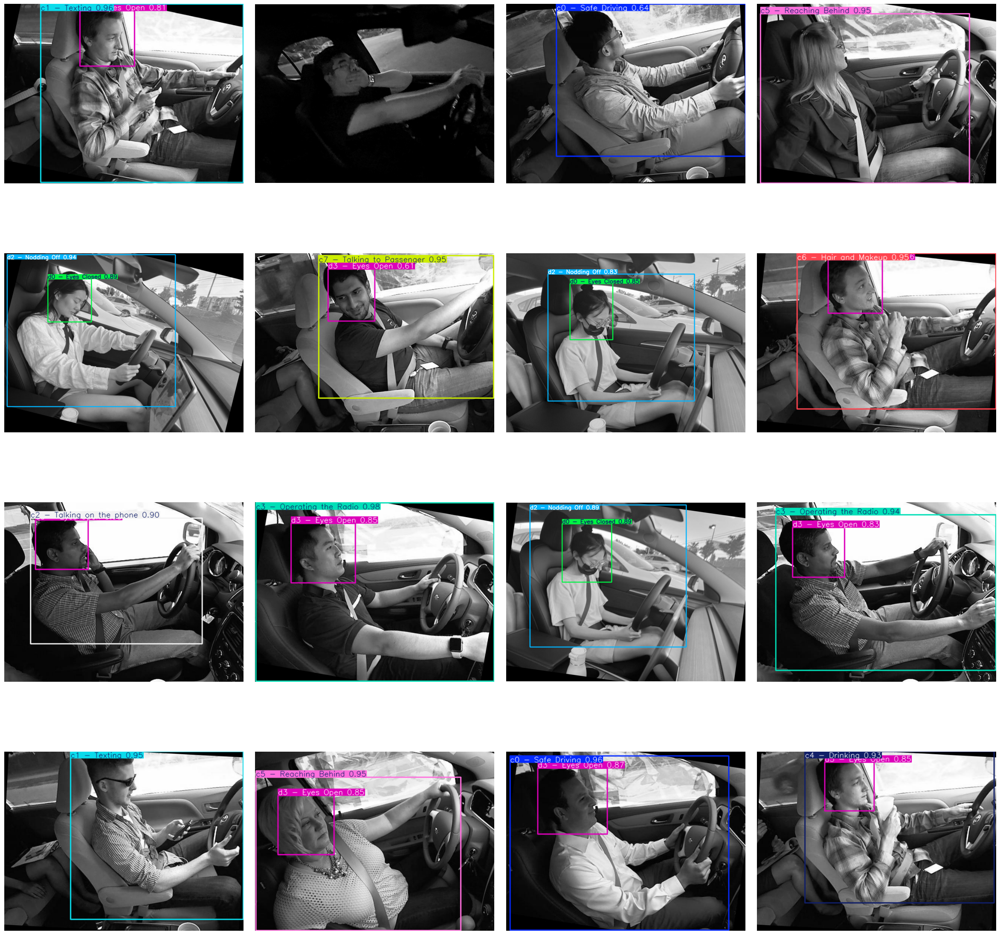

In [16]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(30,30))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):
    
    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4
    
    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)
    
    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)